In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('train.csv')
data

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False


In [3]:
data.info

<bound method DataFrame.info of      PassengerId HomePlanet CryoSleep     Cabin    Destination   Age    VIP  \
0        0001_01     Europa     False     B/0/P    TRAPPIST-1e  39.0  False   
1        0002_01      Earth     False     F/0/S    TRAPPIST-1e  24.0  False   
2        0003_01     Europa     False     A/0/S    TRAPPIST-1e  58.0   True   
3        0003_02     Europa     False     A/0/S    TRAPPIST-1e  33.0  False   
4        0004_01      Earth     False     F/1/S    TRAPPIST-1e  16.0  False   
...          ...        ...       ...       ...            ...   ...    ...   
8688     9276_01     Europa     False    A/98/P    55 Cancri e  41.0   True   
8689     9278_01      Earth      True  G/1499/S  PSO J318.5-22  18.0  False   
8690     9279_01      Earth     False  G/1500/S    TRAPPIST-1e  26.0  False   
8691     9280_01     Europa     False   E/608/S    55 Cancri e  32.0  False   
8692     9280_02     Europa     False   E/608/S    TRAPPIST-1e  44.0  False   

      RoomService  

In [4]:
data.shape

(8693, 14)

In [5]:
data.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
count,8514.000000,8512.000000,8510.000000,8485.000000,8510.000000,8505.000000
mean,28.827930,224.687617,458.077203,173.729169,311.138778,304.854791
std,14.489021,666.717663,1611.489240,604.696458,1136.705535,1145.717189
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,47.000000,76.000000,27.000000,59.000000,46.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000


In [6]:
data.isnull().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

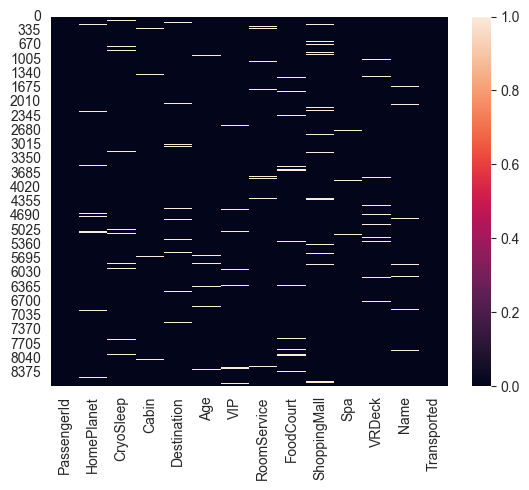

In [7]:
sns.heatmap(pd.isnull(data));

Let's see if target is balanced or not.

<AxesSubplot: >

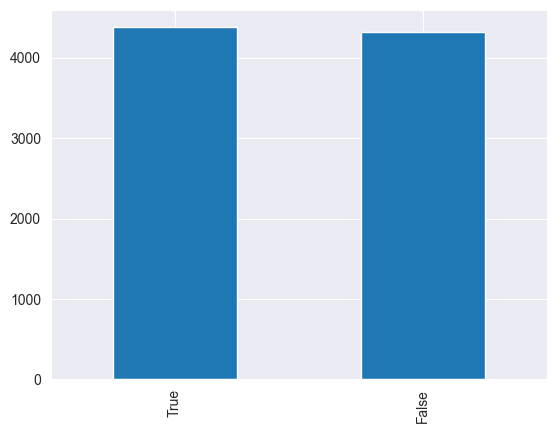

In [8]:
plot_df = data.Transported.value_counts()
plot_df.plot(kind="bar")

so the data is balanced

<AxesSubplot: xlabel='VIP', ylabel='count'>

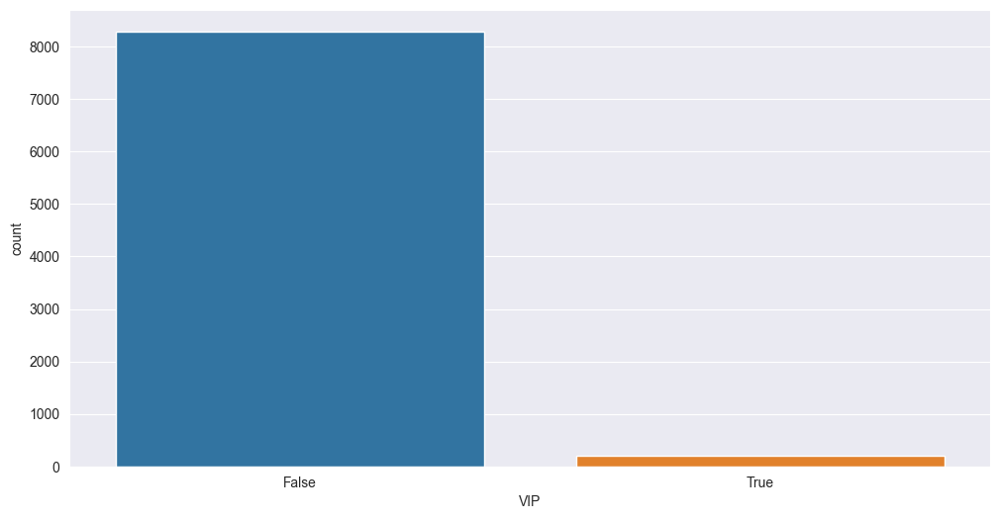

In [9]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x='VIP')

Let's check the distribution of data

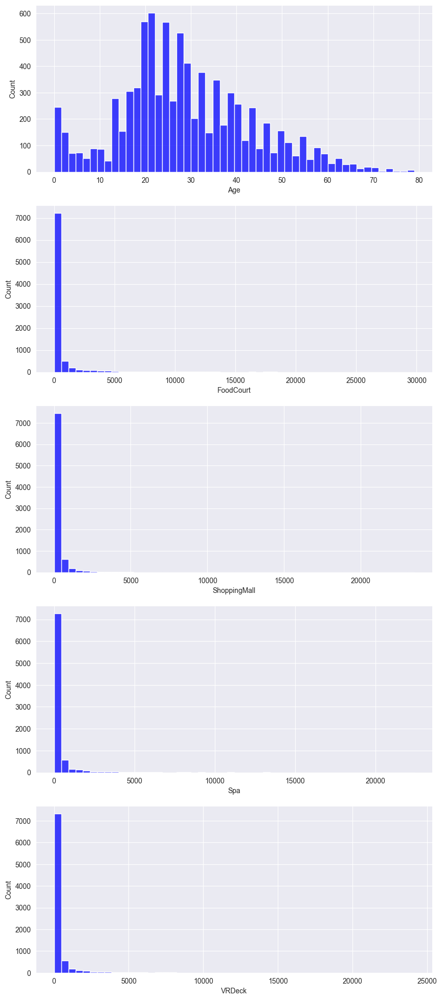

In [10]:
fig, ax = plt.subplots(5,1,  figsize=(10, 10))
plt.subplots_adjust(top = 2)

sns.histplot(data['Age'], color='b', bins=50, ax=ax[0]);
sns.histplot(data['FoodCourt'], color='b', bins=50, ax=ax[1]);
sns.histplot(data['ShoppingMall'], color='b', bins=50, ax=ax[2]);
sns.histplot(data['Spa'], color='b', bins=50, ax=ax[3]);
sns.histplot(data['VRDeck'], color='b', bins=50, ax=ax[4]);

As we can see all of these data(above plots) have a skewness.


 Analyzing the graphs here, it turns out that the values of the variables are not normally distributed. 



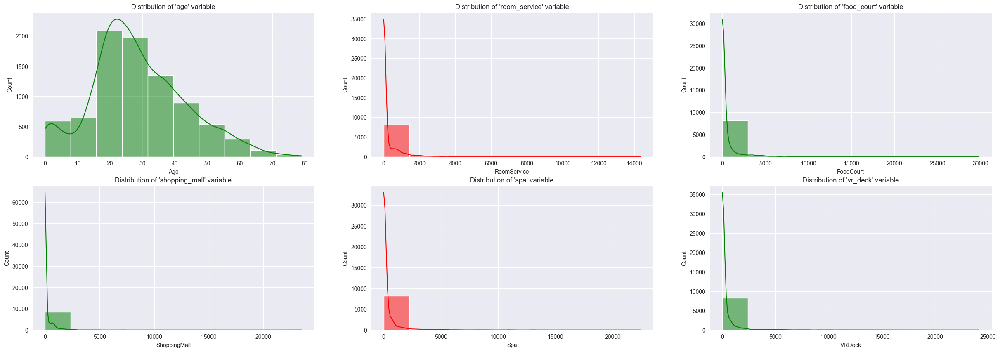

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(30, 10))
axes = axes.flatten()
sns.histplot(ax = axes[0], x = data["Age"],
             bins = 10,
             kde = True,
             color = "g").set(title = "Distribution of 'age' variable");

sns.histplot(ax = axes[1], x = data["RoomService"],
             bins = 10,
             kde = True,
             color = "r").set(title = "Distribution of 'room_service' variable");

sns.histplot(ax = axes[2], x = data["FoodCourt"],
             bins = 10,
             kde = True,
             color = "g").set(title = "Distribution of 'food_court' variable");

sns.histplot(ax = axes[3], x = data["ShoppingMall"],
             bins = 10,
             kde = True,
             color = "g").set(title = "Distribution of 'shopping_mall' variable");

sns.histplot(ax = axes[4], x = data["Spa"],
             bins = 10,
             kde = True,
             color = "r").set(title = "Distribution of 'spa' variable");

sns.histplot(ax = axes[5], x = data["VRDeck"],
             bins = 10,
             kde = True,
             color = "g").set(title = "Distribution of 'vr_deck' variable");

print("\n Analyzing the graphs here, it turns out that the values of the variables are not normally distributed. \n")

Let's group people by their age.

In [12]:
baby = data[data["Age"] <= 5]
kid = data[(data["Age"] > 5) & (data["Age"] <= 10)]
teenager = data[(data["Age"] > 10) & (data["Age"] <= 20)]
youth = data[(data["Age"] > 20) & (data["Age"] <= 40)]
adult = data[(data["Age"] > 40) & (data["Age"] <= 60)]
old = data[(data["Age"] > 60)]

print("Number of baby passengers: ", baby.shape[0])
print("Number of kid passengers: ", kid.shape[0])
print("Number of teenager passengers: ", teenager.shape[0])
print("Number of youth passengers: ", youth.shape[0])
print("Number of adult passengers: ", adult.shape[0])
print("Number of old passengers: ", old.shape[0])

Number of baby passengers:  499
Number of kid passengers:  219
Number of teenager passengers:  1717
Number of youth passengers:  4348
Number of adult passengers:  1511
Number of old passengers:  220


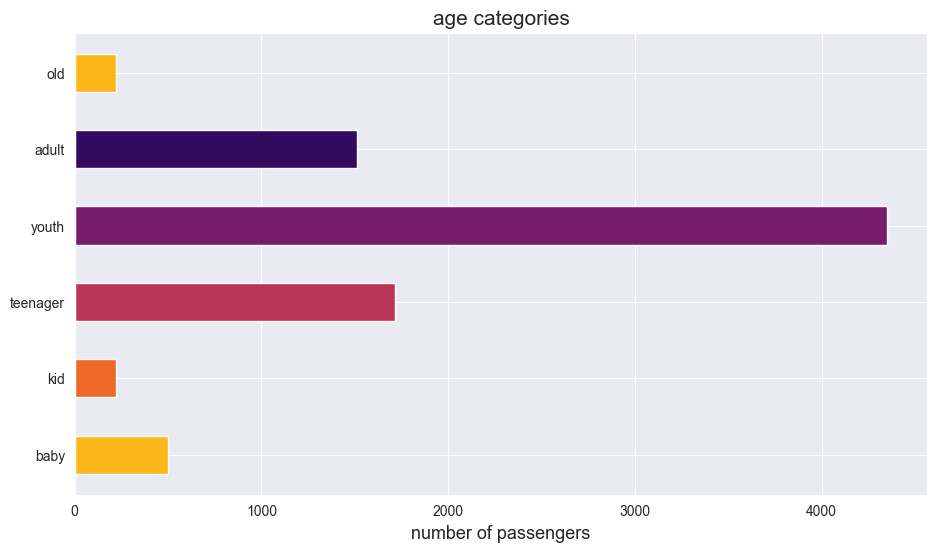

In [13]:
ages = {"baby" : baby.shape[0], "kid" : kid.shape[0],
        "teenager" : teenager.shape[0], "youth" : youth.shape[0],
        "adult" : adult.shape[0], "old" : old.shape[0]}
ages = pd.Series(ages)

plt.figure(figsize = (11, 6))
plt.title("age categories", fontsize = 15)
plt.xlabel("number of passengers", fontsize = 13)

plt.barh(ages.index, ages.values, color = sns.color_palette("inferno_r", 5),
         height = 0.5)
plt.show()

As we can see youth people are more than the other.

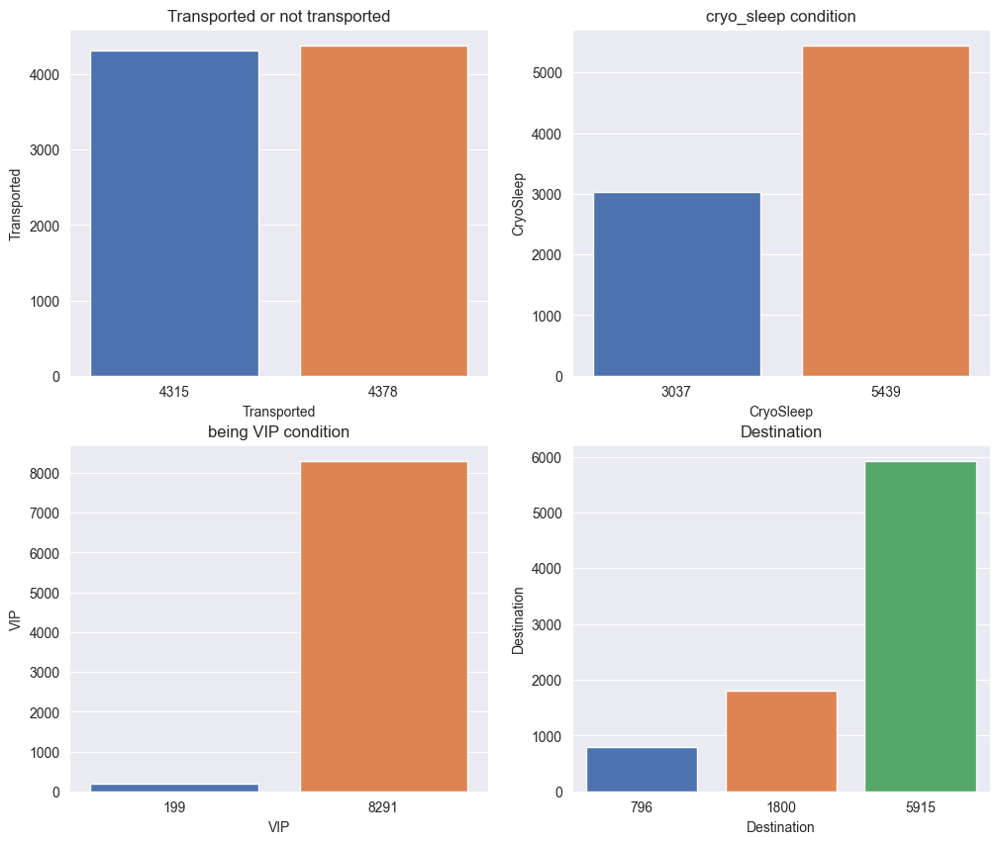

In [14]:
data["Transported"] = data["Transported"].replace(to_replace = [False, True],
                                  value = ["No", "Yes"])
data["VIP"] = data["VIP"].replace(to_replace = [False, True],
                                  value = ["No", "Yes"]).astype("object")
data["CryoSleep"] = data["CryoSleep"].replace(to_replace = [False, True],
                                  value = ["No", "Yes"]).astype("object")
fig, axes = plt.subplots(2, 2, figsize = (12, 10))
axes = axes.flatten()
sns.set_theme(style = "whitegrid")
sns.barplot(ax = axes[0], x = data["Transported"].value_counts(),
            y = data["Transported"].value_counts(),
            data = data, saturation = 1).set(title = "Transported or not transported");

sns.barplot(ax = axes[1], x = data["CryoSleep"].value_counts(),
            y = data["CryoSleep"].value_counts(),
            data = data, saturation = 1).set(title = "cryo_sleep condition");

sns.barplot(ax = axes[2], x = data["VIP"].value_counts(),
            y = data["VIP"].value_counts(),
            data = data, saturation = 1).set(title = "being VIP condition");

sns.barplot(ax = axes[3], x = data["Destination"].value_counts(),
            y = data["Destination"].value_counts(),
            data = data, saturation = 1).set(title = "Destination");

By using last cell we can get that our categorical features are not balance(except transported)

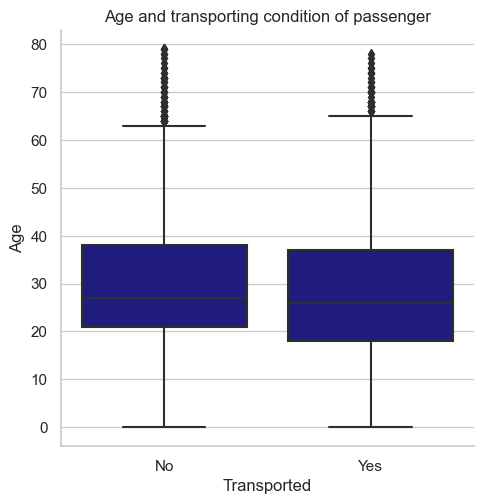

In [15]:
sns.catplot(x = "Transported",
            y = "Age",
            kind = "box",
            color = '#100C8E',
            data = data).set(title = "Age and transporting condition of passenger");

This box plot can help us again to understand that transported is balance.

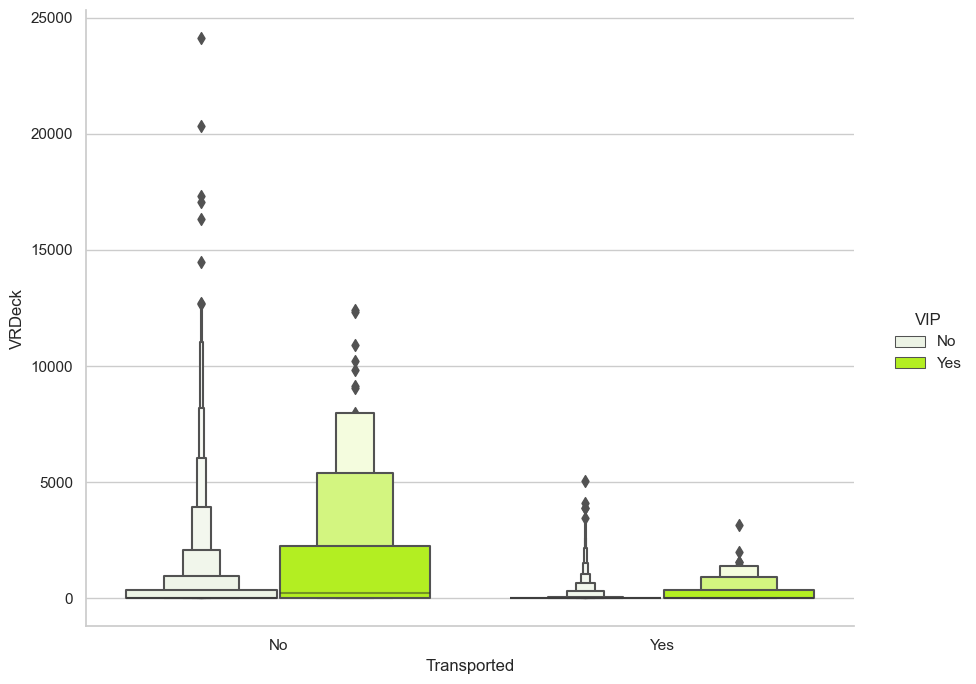

In [16]:
sns.catplot(x = "Transported",
            y = "VRDeck",
            kind = "boxen",
            hue = "VIP",
            ci = "sd",
            color = '#B3EE22',
            data = data, saturation = 1, height = 7, aspect = 1.3,
            margin_titles = True);

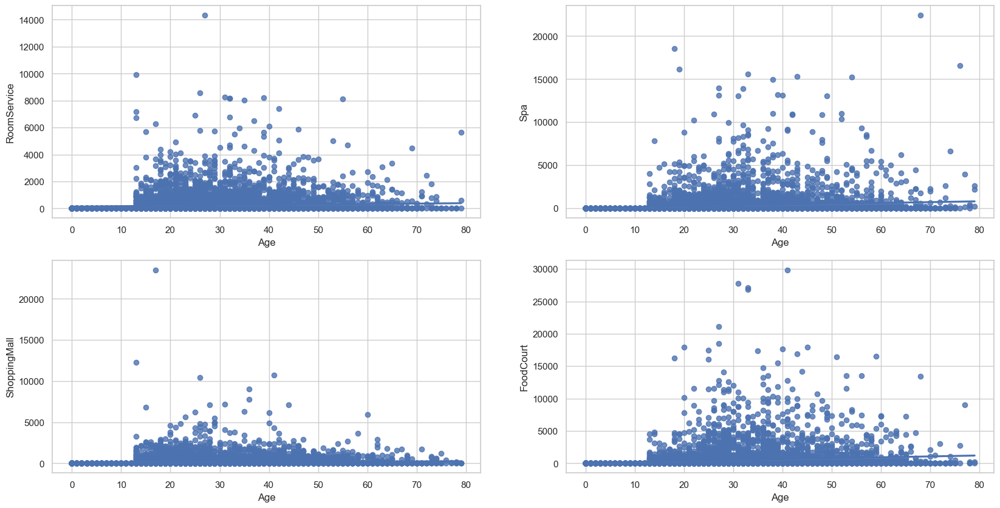

In [17]:
fig, axes = plt.subplots(2, 2, figsize = (20, 10))
axes = axes.flatten()

sns.regplot(ax = axes[0], x = "Age", y = "RoomService", data = data);
sns.regplot(ax = axes[1], x = "Age", y = "Spa", data = data);
sns.regplot(ax = axes[2], x = "Age", y = "ShoppingMall", data = data);
sns.regplot(ax = axes[3], x = "Age", y = "FoodCourt", data = data);

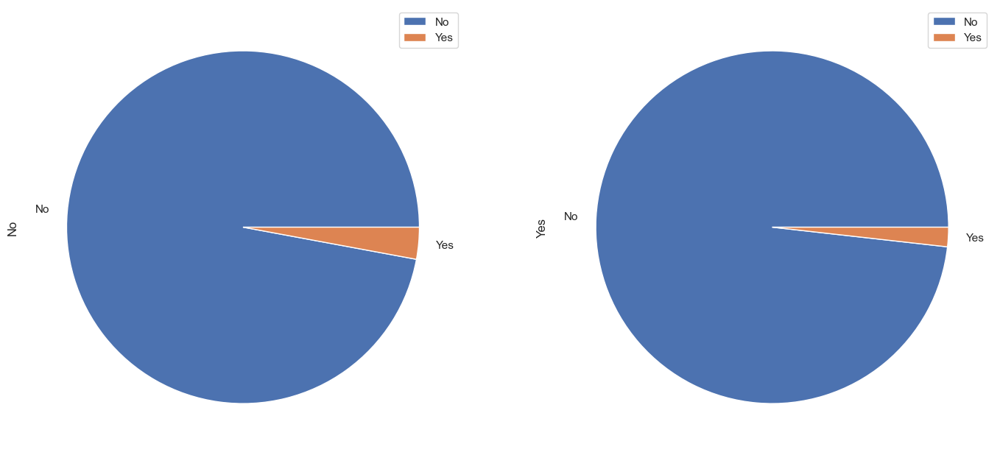

In [18]:
pd.crosstab(data["VIP"], data["Transported"],
            normalize = True).plot(kind = "pie",
                                   figsize = (17, 10), subplots = True, stacked=True);

This plot shows us that being a VIP or not is not very important in column of transported.

<AxesSubplot: xlabel='Transported', ylabel='RoomService'>

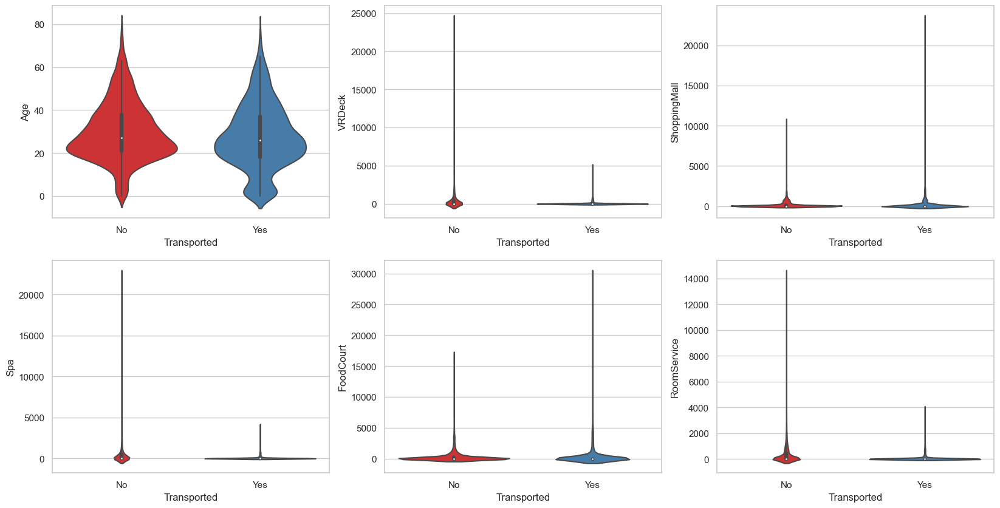

In [19]:
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

sns.violinplot(y='Age', x='Transported', data=data, palette='Set1', ax=axs[0][0])
sns.violinplot(y='VRDeck', x='Transported', data=data, palette='Set1', ax=axs[0][1])
sns.violinplot(y='Spa', x='Transported', data=data, palette='Set1', ax=axs[1][0])
sns.violinplot(y='FoodCourt', x='Transported', data=data, palette='Set1', ax=axs[1][1])
sns.violinplot(y='ShoppingMall', x='Transported', data=data, palette='Set1', ax=axs[0][2])
sns.violinplot(y='RoomService', x='Transported', data=data, palette='Set1', ax=axs[1][2])

These plots help us to understand the distribution of transported or not data in terms of other features.

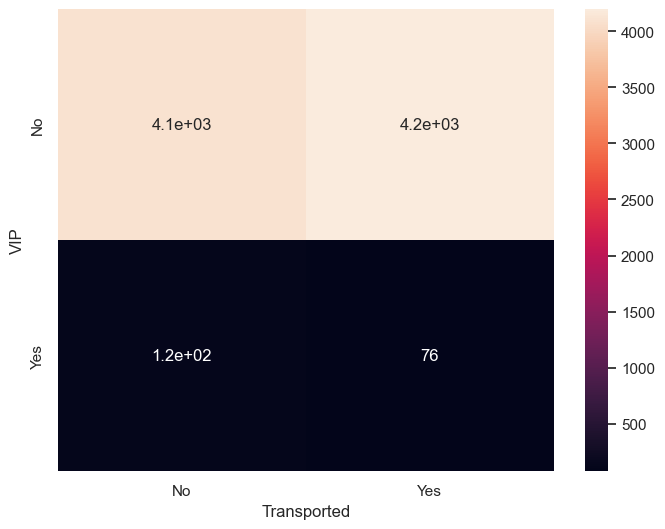

In [20]:
plt.figure(figsize=(8, 6))
sns.heatmap(pd.crosstab(data['VIP'], data['Transported']), annot=True)
plt.ylabel('VIP')
plt.xlabel('Transported')
plt.show()

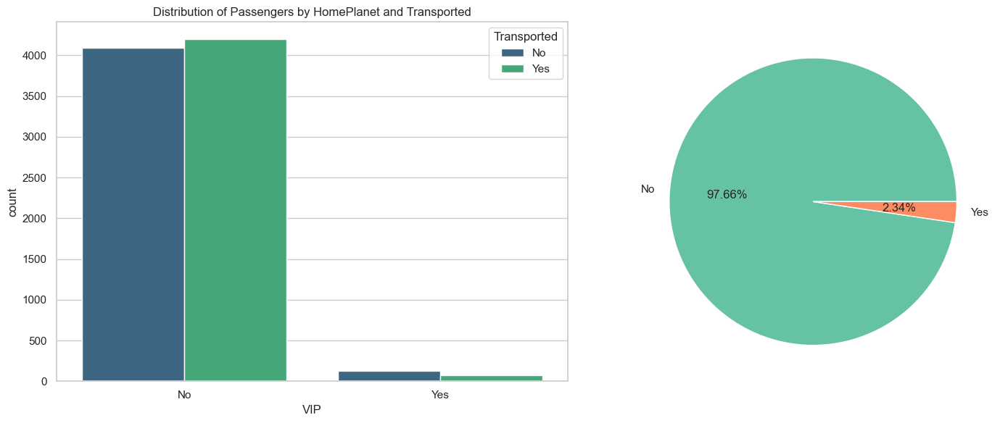

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.countplot(x='VIP', hue='Transported', data=data, palette='viridis', ax=axes[0]).set_title('Distribution of Passengers by HomePlanet and Transported')
plt.pie(data['VIP'].value_counts(), labels=data['VIP'].value_counts().index, autopct='%.2f%%', colors=sns.color_palette('Set2'))
plt.tight_layout()
plt.show()

From this plot we can see that not being VIP has a direct effect on being transported and being VIP has a effect on not be transported.

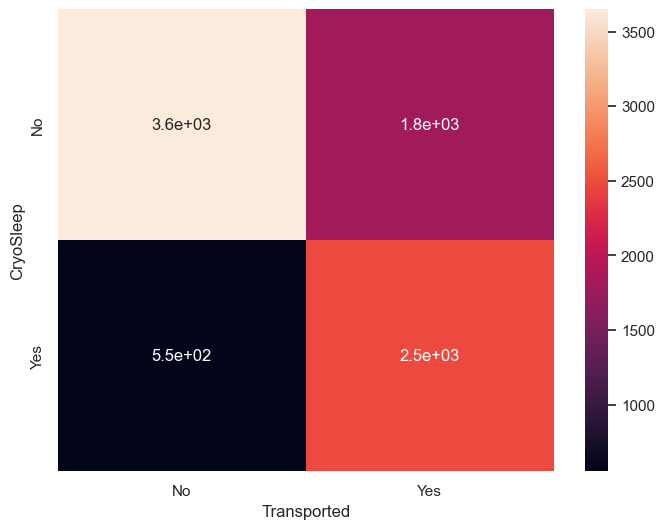

In [22]:
plt.figure(figsize=(8, 6))
sns.heatmap(pd.crosstab(data['CryoSleep'], data['Transported']), annot=True)
plt.ylabel('CryoSleep')
plt.xlabel('Transported')
plt.show()

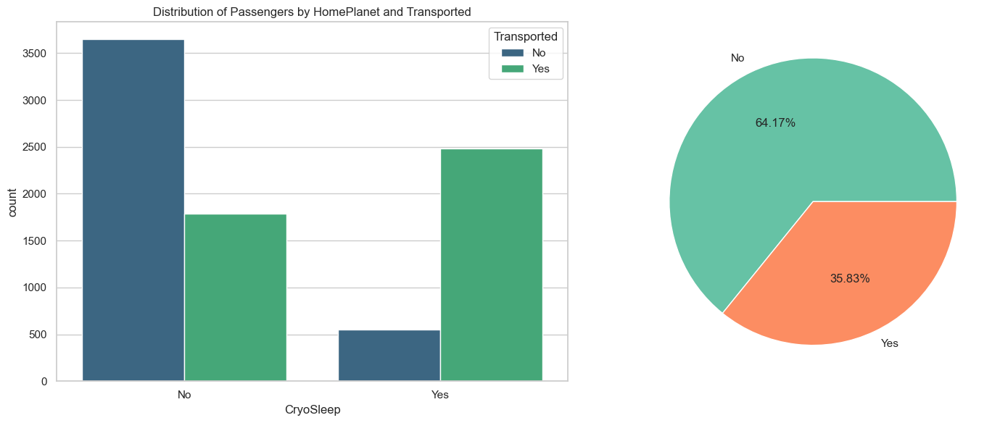

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.countplot(x='CryoSleep', hue='Transported', data=data, palette='viridis', ax=axes[0]).set_title('Distribution of Passengers by HomePlanet and Transported')
plt.pie(data['CryoSleep'].value_counts(), labels=data['CryoSleep'].value_counts().index, autopct='%.2f%%', colors=sns.color_palette('Set2'))
plt.tight_layout()
plt.show()

Being CryoSleep or not has a direct effect on being Transported(if be false then transported with higher chance would be false and vise versa).

In [24]:
import plotly.express as px
fig = px.histogram(data_frame = data,
                   x="Age",
                   color_discrete_sequence =  ['#58D68D','#DE3163'],
                   marginal="box",
                   nbins= 100,
                    template="plotly_white"
                )
fig.update_layout(title = "Distribution of Age" , title_x = 0.5)
fig.show()

In [25]:
numerical_cols=["Age","RoomService","Spa","VRDeck","ShoppingMall","FoodCourt"]
categorical_cols=[feature for feature in data.columns if feature not in numerical_cols]
feature = 'HomePlanet'
df=data[feature].value_counts().reset_index()

fig=px.pie(df,values=df.columns[1],names=df.columns[0],
           labels={"index":"<b>"+feature,feature:"Count"},
           color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_layout(title="<b>"+feature, title_font_size=30,
                  font_size=20,
                  title_x=0.5,legend_bordercolor="#000",legend_borderwidth=2,
                  hoverlabel_font_size=20)
fig.update_traces(marker=dict( line=dict(color='#000000', width=2)))
fig.show()

## Observation

__Homeplanet:__ most people was from Earth Followed by Europa, Mars

__Cryosleep:__ most people was not in CryoSleep

__Destination:__ mostly people was debarking to TRAPPIST-1e Followed by Canri e, PSO

__Vip:__ frequency of non VIP people quite large Compared VIP people

__Transported:__ no. of non transported is greater than transported people

__No.inGroup:__ Majority of the were travellling alone in their group

__Cabin Name:__ majority of people were in G and F cabin .

__Cabin side:__ NO of people on both sides is almost equal

In [26]:
for feature in categorical_cols:
     if feature not in['Passenger_group','firstname','last_name','Cabin_no.',"Transported"]:
        fig=px.histogram(data,x=feature,facet_col="Transported",color="Transported",color_discrete_sequence=px.colors.qualitative.Alphabet_r)
        fig.update_layout(title="<b>"+feature+" vs Transported", title_font_size=30,
                             font_size=20,
                             title_x=0.5,
                             hoverlabel_font_size=20,template="plotly_dark")

        fig.show()



## Observation
Homeplanet - Europa amd marks has more transported people than Earth even though earth has more no. of people transported but it has lower transport %
Cryosleep - cryosleep people shows better transport percentage than non cryosleep people(so if you are in cryosleep you are most like be transported)
Destination- Trappist-1e has greate no of transported people but if we see who has better %of tranported people I will sayits 55 cancrie
Vip- Non Vip person has Equal chance of being on either side (tranported or non transported) but Vip has more than half the chance that they will not transported ..
Cabin - Deck B And C has more chance of getting transported . E has more chance of getting Not tranported.
Cabin Side - equal chance on both cabin being on either of side as code



In [27]:
for feature in numerical_cols:
    fig=px.violin(data,x=feature,color="Transported",title="<b>"+feature+" Distribution",template="plotly_dark" )
    fig.update_layout(hovermode='x',title_font_size=30)
    fig.update_layout(
    title_font_color="#ffff00",
    template="plotly_dark",
    title_font_size=30,
    hoverlabel_font_size=20,
    title_x=0.5
    )
    fig.show()

In [28]:
for feature in numerical_cols:
    fig=px.histogram(data,x=feature,title="<b>"+feature+"Vs Transported",color="Transported",template="plotly_dark")
    fig.update_layout(hovermode='x',title_font_size=30)
    fig.update_layout(
    title_font_color="#ffff00",
    template="plotly_dark",
    title_font_size=30,
    hoverlabel_font_size=20,
    title_x=0.5)
    fig.show()

## Obervation
skewed data(right)
all of them have outliers
Age show similar distribution except when age is b/w 0-4 where people were transported very much large than no transported why this age is zero??

In [29]:
data["Transported"] = data["Transported"].replace(to_replace = ["No", "Yes"],
                                  value = [False, True])
fig=px.parallel_coordinates(data,color="Transported",title="<b>Multivariate plot for Numerical Data", color_continuous_scale='Viridis',
                              range_color=(0, 1))
fig.update_layout(title_font_size=30,title_x=0.5)

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



Cant see very strong relationship in any of the numerical features

In [30]:
data[["Cabin_deck","Cabin_no.","Cabin_side"]]=data["Cabin"].str.split("/",expand=True)
fig=px.imshow(
    pd.crosstab(data["Cabin_deck"],data["Cabin_side"]).T
    ,text_auto=True,title="No. of people Travelling in (Cabin_DecK,Cabin_side)",
    labels={"color":"<b>No.of people"},color_continuous_scale=px.colors.sequential.haline_r)
fig.update_layout(font_size=15,font_color="#ffcce6",
                 title_font_size=30,title_font_color="Orange",template="plotly_dark")
fig.show()

In [31]:
fig=px.imshow(
    pd.crosstab(data["Cabin_deck"],data["Cabin_side"],data["Transported"],aggfunc="mean").round(3).T
    ,text_auto=True,title="% of people Transported(1) in (Cabin_DecK,Cabin_side)",
    labels={"color":"<b>%Transpoted"},color_continuous_scale=px.colors.sequential.haline_r)
fig.update_layout(font_size=15,font_color="#ffcce6",
                 title_font_size=30,title_font_color="Orange",template="plotly_dark")
fig.show()

## Observation

Not so much of difference in these categories , I think not much of useful information here

In [32]:
fig=px.imshow(
    pd.crosstab(data["HomePlanet"],data["CryoSleep"]).T
    ,text_auto=True,title="<b>No. of people Travelling in (HomePlanet,Cryosleep)",
    labels={"color":"<b>No.of people"},color_continuous_scale=px.colors.sequential.haline_r)
fig.update_layout(font_size=15,font_color="#ffcce6",
                 title_font_size=30,title_font_color="Orange",template="plotly_dark")
fig.show()

In [33]:
fig=px.imshow(
    pd.crosstab(data["HomePlanet"],data["CryoSleep"],data["Transported"],aggfunc="mean").round(3).T
    ,text_auto=True,title="<b>No. of people Travelling in (HomePlanet,Cryosleep)",
    labels={"color":"<b>%Transpoted"},color_continuous_scale=px.colors.sequential.haline_r)
fig.update_layout(font_size=15,font_color="#ffcce6",
                 title_font_size=30,title_font_color="Orange",template="plotly_dark")
fig.show()

## Observation

Europa - Cryosleep people has 99% chance they will get transported , and non crysleep has only 40% chance

Mars - cryosleep people has 91 % cahnce and non cryosleep has only 27 %

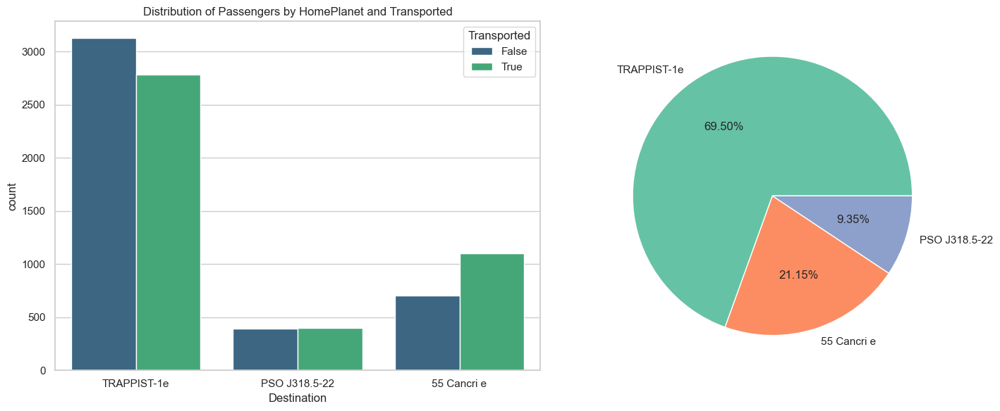

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.countplot(x='Destination', hue='Transported', data=data, palette='viridis', ax=axes[0]).set_title('Distribution of Passengers by HomePlanet and Transported')
plt.pie(data['Destination'].value_counts(), labels=data['Destination'].value_counts().index, autopct='%.2f%%', colors=sns.color_palette('Set2'))
plt.tight_layout()
plt.show()

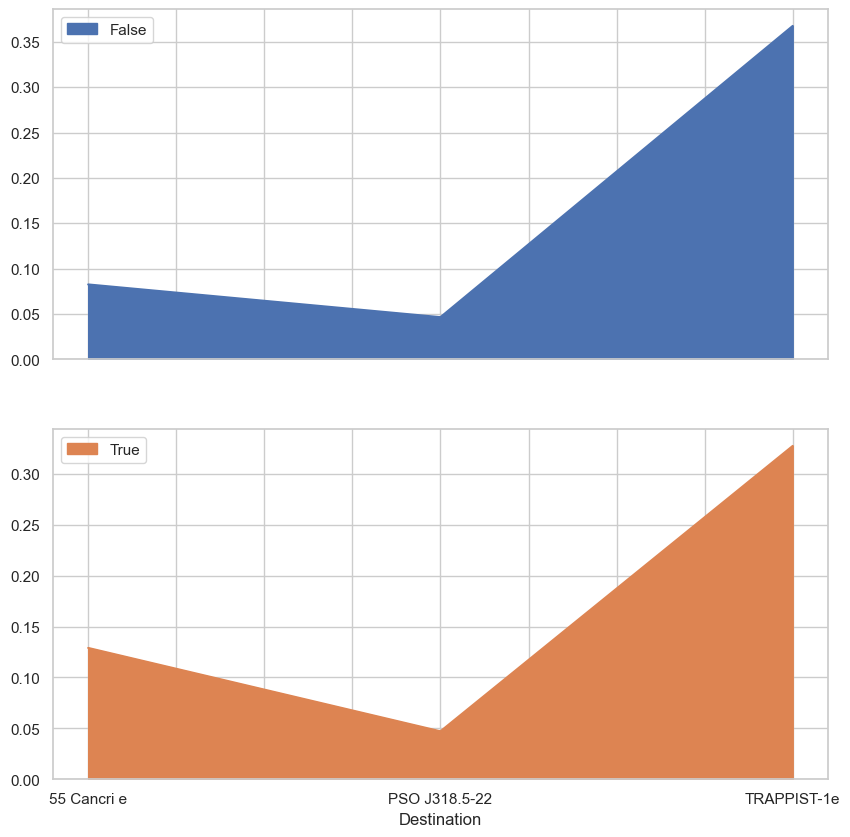

In [35]:
pd.crosstab(data["Destination"], data["Transported"],
            normalize = True).plot(kind = "area",
                                   figsize = (10, 10),
                                   subplots = True, stacked=True);

From these two plots we can see that destination is effective if the destination is Cancri e there is more chance to be transported and if the destination is TRAPPIST-1e there is more chance to not be transported and for PSO J318.5-22 it is 50-50.

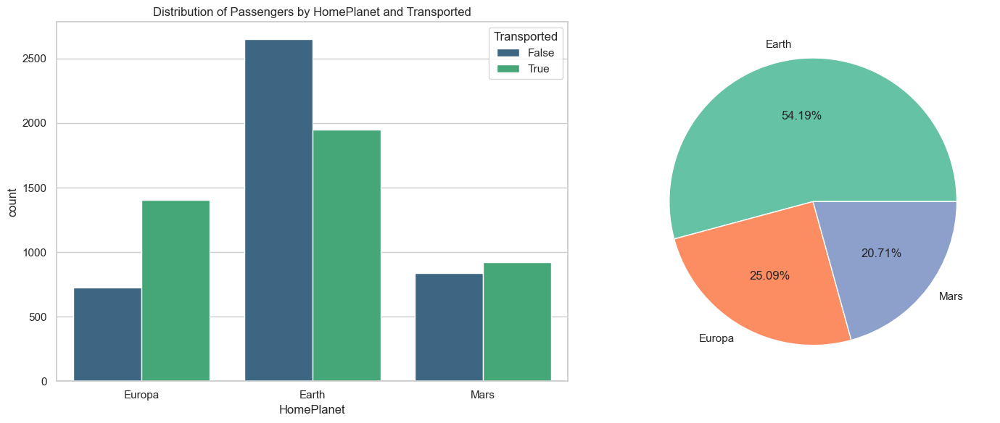

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.countplot(x='HomePlanet', hue='Transported', data=data, palette='viridis', ax=axes[0]).set_title('Distribution of Passengers by HomePlanet and Transported')
plt.pie(data['HomePlanet'].value_counts(), labels=data['HomePlanet'].value_counts().index, autopct='%.2f%%', colors=sns.color_palette('Set2'))
plt.tight_layout()
plt.show()

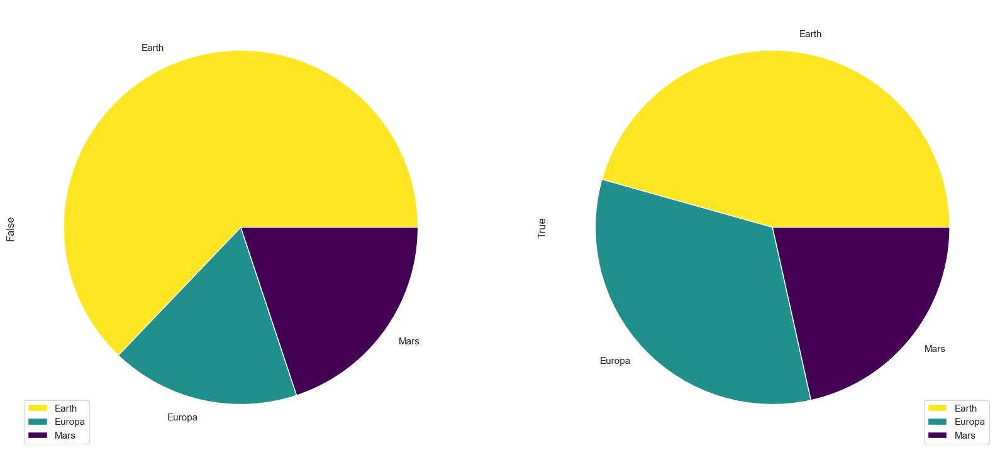

In [37]:
pd.crosstab(data["HomePlanet"], data["Transported"],
            normalize = True).plot(kind = "pie",
                                   figsize = (20, 20), colormap = "viridis_r",
                                   subplots = True, stacked=True);

This plot show us that home planet is effective on transported. As we can see if someone is from Europa with higher chance would be transported, from earth with a higher chance not be transported and for mars it is approximately 50-50.

# cleaning data

In [38]:
data = pd.read_csv('train.csv')

name and passenger id would not help us to improve our model so we drop them.

In [39]:
data = data.drop(['PassengerId', 'Name'], axis=1)
data

,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,False
1,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,True
2,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,False
3,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,False
4,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...
8688,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,False
8689,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,False
8690,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,True
8691,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,False


let's check null values.

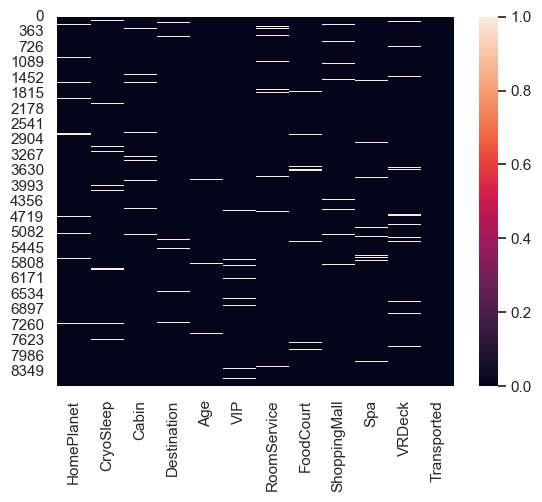

In [40]:
sns.heatmap(pd.isnull(data));

let's fill the categorical null values with mode.

In [41]:
data['HomePlanet'].fillna(data['HomePlanet'].mode()[0], inplace=True)
data.isnull().sum()

HomePlanet        0
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Transported       0
dtype: int64

In [42]:
data['CryoSleep'].fillna(data['CryoSleep'].mode()[0], inplace=True)
data.isnull().sum()

HomePlanet        0
CryoSleep         0
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Transported       0
dtype: int64

In [43]:
data['Cabin'].fillna(data['Cabin'].mode()[0], inplace=True)
data.isnull().sum()

HomePlanet        0
CryoSleep         0
Cabin             0
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Transported       0
dtype: int64

In [44]:
data['Destination'].fillna(data['Destination'].mode()[0], inplace=True)
data.isnull().sum()

HomePlanet        0
CryoSleep         0
Cabin             0
Destination       0
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Transported       0
dtype: int64

In [45]:
data['VIP'].fillna(data['VIP'].mode()[0], inplace=True)
data.isnull().sum()

HomePlanet        0
CryoSleep         0
Cabin             0
Destination       0
Age             179
VIP               0
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Transported       0
dtype: int64

Now let's fill the numerical data with sklearn.impute.KKNImputer

In [46]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(missing_values=np.nan)
temp = data[["Age","RoomService","Spa","VRDeck","ShoppingMall","FoodCourt"]]
data = data.drop(["Age","RoomService","Spa","VRDeck","ShoppingMall","FoodCourt"], axis=1)
temp = pd.DataFrame(imputer.fit_transform(temp), columns=temp.columns, index=temp.index)
temp.isnull().sum()

Age             0
RoomService     0
Spa             0
VRDeck          0
ShoppingMall    0
FoodCourt       0
dtype: int64

In [47]:
data = pd.DataFrame(pd.concat([data, temp], axis=1))
data.isnull().sum()

HomePlanet      0
CryoSleep       0
Cabin           0
Destination     0
VIP             0
Transported     0
Age             0
RoomService     0
Spa             0
VRDeck          0
ShoppingMall    0
FoodCourt       0
dtype: int64

In [48]:
data.shape

(8693, 12)

let's drop duplicated data

In [49]:
data = data.drop_duplicates()
data.shape

(8668, 12)

let's remove outliers

In [50]:
def remove_outliers(df, numeric_only=True, method='z-score', threshold=3):
    """
    Removes numerical outliers from a Pandas DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame to be cleaned.
    numeric_only (bool, optional): If True, only numeric columns will be processed. If False, all columns will be processed. Default is True.
    method (str, optional): The method to use for outlier detection. Can be 'z-score' or 'iqr'. Default is 'z-score'.
    threshold (float, optional): The threshold for outlier detection. Default is 3.

    Returns:
    pandas.DataFrame: The cleaned DataFrame with outliers removed.
    """
    df_clean = df.copy()

    for column in df.columns:
        if numeric_only and df[column].dtype not in ['int64', 'float64']:
            continue

        if method == 'z-score':
            # Calculate the z-score
            z = np.abs((df[column] - df[column].mean()) / df[column].std())

            # Create a boolean mask for outliers
            outlier_mask = z > threshold
        elif method == 'iqr':
            # Calculate the interquartile range (IQR)
            q1 = df[column].quantile(0.25)
            q3 = df[column].quantile(0.75)
            iqr = q3 - q1

            # Define the lower and upper bounds for outliers
            lower_bound = q1 - threshold * iqr
            upper_bound = q3 + threshold * iqr

            # Create a boolean mask for outliers
            outlier_mask = (df[column] < lower_bound) | (df[column] > upper_bound)
        else:
            raise ValueError("Invalid method. Choose either 'z-score' or 'iqr'.")

        # Remove the outliers
        df_clean = df_clean.loc[~(outlier_mask), :]

    return df_clean

In [51]:
data = remove_outliers(data)
data.shape

(7916, 12)

In [52]:
y = data["Transported"]
x = data.drop(["Transported"], axis=1)

Let's select features in forward way.
First we choose the best one feature model.

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

{'HomePlanet': 0.6058593675223493,
 'CryoSleep': 0.7194296885468712,
 'Cabin': 0.5944968478212319,
 'Destination': 0.5416871654000522,
 'VIP': 0.5236229955907783,
 'Age': 0.5371420299010319,
 'RoomService': 0.6547504418793112,
 'Spa': 0.6478032057785691,
 'VRDeck': 0.6347908969671445,
 'ShoppingMall': 0.6325165744622472,
 'FoodCourt': 0.6138196558127069}

As we can see model with CryoSleep is the best.(0.7194296885468712)
Now we will go on two feature.

In [54]:
xSelected = x['CryoSleep']
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep':
        continue
    elif column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

{'HomePlanet': 0.716397471237964,
 'Cabin': 0.726756350619269,
 'Destination': 0.7194296885468712,
 'VIP': 0.7194296885468712,
 'Age': 0.7335776431401826,
 'RoomService': 0.6923956080067893,
 'Spa': 0.6955538486571335,
 'VRDeck': 0.6917645341603016,
 'ShoppingMall': 0.7042713936586331,
 'FoodCourt': 0.7175343932055871}

As we can see model with CryoSleep and Age is the best.(0.7335776431401826)
Now we will go on three feature.

In [ ]:
xSelected = x[['CryoSleep', 'Age']]
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'Age':
        continue
    elif column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa is the best.(0.740778042586318)
Now we will go on four feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa']]
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa':
        continue
    elif column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck is the best.(0.7462104462183425)
Now we will go on five feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck']]
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck':
        continue
    elif column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService is the best.(0.7651580556034125)
Now we will go on six feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck', 'RoomService']]
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck' or column == 'RoomService':
        continue
    elif column == 'Cabin':
        xTemp[["Deck", "Cabin_num", "Side"]] = x["Cabin"].str.split("/", expand=True)
        xTemp = pd.get_dummies(xTemp, columns=["Deck", "Cabin_num", "Side"])
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService and Cabin is the best.(0.7697087744150284)
Now we will go on seven feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck', 'RoomService', 'Cabin']]
xSelected[["Deck", "Cabin_num", "Side"]] = xSelected["Cabin"].str.split("/", expand=True)
xSelected = pd.get_dummies(xSelected, columns=["Deck", "Cabin_num", "Side"])
xSelected = xSelected.drop('Cabin', axis=1)
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck' or column == 'RoomService' or column == 'Cabin':
        continue
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService and Cabin and HomePlanet is the best.(0.7723613264674541)
Now we will go on eight feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck', 'RoomService', 'Cabin', 'HomePlanet']]
xSelected[["Deck", "Cabin_num", "Side"]] = xSelected["Cabin"].str.split("/", expand=True)
xSelected = pd.get_dummies(xSelected, columns=["Deck", "Cabin_num", "Side"])
xSelected = xSelected.drop('Cabin', axis=1)
xSelected = pd.get_dummies(xSelected, columns=["HomePlanet"])
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck' or column == 'RoomService' or column == 'Cabin' or column == 'HomePlanet':
        continue
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService and Cabin and HomePlanet and Destination is the best.(0.7743825653885666)
Now we will go on nine feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck', 'RoomService', 'Cabin', 'HomePlanet', 'Destination']]
xSelected[["Deck", "Cabin_num", "Side"]] = xSelected["Cabin"].str.split("/", expand=True)
xSelected = pd.get_dummies(xSelected, columns=["Deck", "Cabin_num", "Side"])
xSelected = xSelected.drop('Cabin', axis=1)
xSelected = pd.get_dummies(xSelected, columns=["HomePlanet"])
xSelected = pd.get_dummies(xSelected, columns=["Destination"])
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck' or column == 'RoomService' or column == 'Cabin' or column == 'HomePlanet' or column == 'Destination':
        continue
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService and Cabin and HomePlanet and Destination and Age is the best.(0.7743825653885666)
Now we will go on ten feature.

In [ ]:
xSelected = x[['CryoSleep', 'FoodCourt', 'Spa', 'VRDeck', 'RoomService', 'Cabin', 'HomePlanet', 'Destination', 'Age']]
xSelected[["Deck", "Cabin_num", "Side"]] = xSelected["Cabin"].str.split("/", expand=True)
xSelected = pd.get_dummies(xSelected, columns=["Deck", "Cabin_num", "Side"])
xSelected = xSelected.drop('Cabin', axis=1)
xSelected = pd.get_dummies(xSelected, columns=["HomePlanet"])
xSelected = pd.get_dummies(xSelected, columns=["Destination"])
scores = {}
for column in x.columns:
    xTemp = pd.DataFrame()
    if column == 'CryoSleep' or column == 'FoodCourt' or column == 'Spa' or column == 'VRDeck' or column == 'RoomService' or column == 'Cabin' or column == 'HomePlanet' or column == 'Destination' or column == 'Age':
        continue
    elif x[column].dtype in ['object', 'category', 'string']:
        xTemp = pd.get_dummies(x[column], columns=column)
    else:
        xTemp = pd.DataFrame(x[column])
    xTemp = pd.concat([xSelected, xTemp], axis=1)
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    score = cross_val_score(classifier, xTemp, y, cv=5)
    scores[column] = np.mean(score)
scores

As we can see model with CryoSleep and FoodCourt and Spa and VRDeck and RoomService and Cabin and HomePlanet and Destination and Age and ShoppingMall is the best.(0.7751404601925763)
Now we will go on all feature.

In [ ]:
xSelected = x
xSelected[["Deck", "Cabin_num", "Side"]] = xSelected["Cabin"].str.split("/", expand=True)
xSelected = pd.get_dummies(xSelected, columns=["Deck", "Cabin_num", "Side"])
xSelected = xSelected.drop('Cabin', axis=1)
xSelected = pd.get_dummies(xSelected, columns=["HomePlanet"])
xSelected = pd.get_dummies(xSelected, columns=["Destination"])
classifier = RandomForestClassifier(n_estimators=100, random_state=42)
score = cross_val_score(classifier, xSelected, y, cv=5)
np.mean(score)

Train a model on data without feature engineering

In [ ]:
dataset = pd.read_csv('train.csv')

In [ ]:
dataset = dataset.dropna()

In [ ]:
yTemp = dataset["Transported"]
xTemp = dataset.drop(["Transported"], axis=1)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
xTemp = xTemp.drop(['PassengerId', 'Name'], axis=1)
xTemp = pd.get_dummies(xTemp, columns=['HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'VIP'])
classifierTemp = RandomForestClassifier(n_estimators=100, random_state=42)
scoresTemp = cross_val_score(classifierTemp, xTemp, yTemp, cv=5)

In [ ]:
print("Cross-validation scores:", scoresTemp)
print("Average cross-validation score:", np.mean(scoresTemp))